<a href="https://colab.research.google.com/github/TJ1810/case-study/blob/main/case_study.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

1) Time series analysis would be appropriate for this case study. We use time series analysis because XYZ Investment Company have collected a dataset containing the stock's price, trading volume, and relevant market indicators for the past five years and time series analysis is a specific way of analyzing a sequence of data points collected over an interval of time.So, to predict future returns of a particular stock based on historical data, time series analysis is the most suitable analysis to be appropriate.



In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn
from sklearn import linear_model
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from pylab import mpl, plt
from sklearn import linear_model
plt.style.use('seaborn')
mpl.rcParams['font.family'] = 'serif'
%config InlineBackend.figure_format = 'svg'

<ipython-input-1-3fa1ce9b62ca>:15: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving indexProcessed.csv to indexProcessed.csv


In [ ]:
from datetime import datetime

In [ ]:
data = pd.read_csv("indexProcessed.csv")

In [ ]:
data = data.replace('HSI', 'HKSE')
data = data.replace('IXIC', 'NDAQ')
data = data.replace('000001.SS', 'SSE')
data = data.replace('N225', 'TSE')
data = data.replace('N100', 'Enext')
data = data.replace('399001.SZ', 'SZSE')
data = data.replace('GSPTSE', 'ToSE')
data = data.replace('NSEI', 'NSEI')
data = data.replace('GDAXI', 'FSE')
data = data.replace('KS11', 'KEx')
data = data.replace('SSMI', 'SSE')
data = data.replace('TWII', 'TaSE')
data = data.replace('J203.JO', 'JSE')
data = data.replace('NYA', 'NYSE')

2) Data processing

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 104224 entries, 0 to 104223
Data columns (total 9 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Index      104224 non-null  object 
 1   Date       104224 non-null  object 
 2   Open       104224 non-null  float64
 3   High       104224 non-null  float64
 4   Low        104224 non-null  float64
 5   Close      104224 non-null  float64
 6   Adj Close  104224 non-null  float64
 7   Volume     104224 non-null  float64
 8   CloseUSD   104224 non-null  float64
dtypes: float64(7), object(2)
memory usage: 7.2+ MB


In [ ]:
data.head()

,Index,Date,Open,High,Low,Close,Adj Close,Volume,CloseUSD
0,HKSE,1986-12-31,2568.300049,2568.300049,2568.300049,2568.300049,2568.300049,0.0,333.879006
1,HKSE,1987-01-02,2540.100098,2540.100098,2540.100098,2540.100098,2540.100098,0.0,330.213013
2,HKSE,1987-01-05,2552.399902,2552.399902,2552.399902,2552.399902,2552.399902,0.0,331.811987
3,HKSE,1987-01-06,2583.899902,2583.899902,2583.899902,2583.899902,2583.899902,0.0,335.906987
4,HKSE,1987-01-07,2607.100098,2607.100098,2607.100098,2607.100098,2607.100098,0.0,338.923013


In [ ]:
data.tail()

,Index,Date,Open,High,Low,Close,Adj Close,Volume,CloseUSD
104219,JSE,2021-05-25,66054.92188,66812.45313,66022.97656,66076.67969,66076.67969,0.0,4625.367578
104220,JSE,2021-05-26,66076.67969,66446.36719,66030.35156,66108.22656,66108.22656,0.0,4627.575859
104221,JSE,2021-05-27,66108.22656,66940.25000,66102.54688,66940.25000,66940.25000,0.0,4685.817500
104222,JSE,2021-05-28,66940.25000,67726.56250,66794.60938,67554.85938,67554.85938,0.0,4728.840157
104223,JSE,2021-05-31,67554.85938,68140.85156,67554.85938,67964.03906,67964.03906,0.0,4757.482734


In [ ]:
data.describe().round(2)

,Open,High,Low,Close,Adj Close,Volume,CloseUSD
count,104224.00,104224.00,104224.00,104224.00,104224.00,1.042240e+05,104224.00
mean,8015.35,8063.32,7962.58,8014.37,8014.16,1.347646e+09,3046.73
std,9140.56,9196.58,9082.77,9140.61,9140.72,4.427662e+09,3747.87
min,54.87,54.87,54.87,54.87,54.87,0.000000e+00,10.20
25%,2046.89,2057.21,2037.19,2047.51,2047.36,0.000000e+00,320.46
50%,5772.14,5812.76,5725.20,5773.71,5773.71,9.529000e+05,1371.60
75%,10487.38,10552.18,10416.09,10488.62,10488.62,2.064676e+08,4383.05
max,68775.06,69403.75,68516.99,68775.06,68775.06,9.440374e+10,18934.38


In [ ]:
HKSE = data[data['Index'] == 'HKSE']
NDAQ = data[data['Index'] == 'NDAQ']
SSE = data[data['Index'] == 'SSE']
TSE = data[data['Index'] == 'TSE']
Enext = data[data['Index'] == 'Enext']
SZSE = data[data['Index'] == 'SZSE']
ToSE = data[data['Index'] == 'ToSE']
NSEI = data[data['Index'] == 'NSEI']
FSE = data[data['Index'] == 'FSE']
KEx = data[data['Index'] == 'KEx']
TaSE = data[data['Index'] == 'TaSE']
JSE = data[data['Index'] == 'JSE']
NYSE = data[data['Index'] == 'NYSE']

In [ ]:
HKSE.info()
NDAQ.info()
SSE.info()
TSE.info()
Enext.info()
SZSE.info()
ToSE.info()
NSEI.info()
FSE.info()
KEx.info()
TaSE.info()
JSE.info()
NYSE.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8492 entries, 0 to 8491
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Index      8492 non-null   object 
 1   Date       8492 non-null   object 
 2   Open       8492 non-null   float64
 3   High       8492 non-null   float64
 4   Low        8492 non-null   float64
 5   Close      8492 non-null   float64
 6   Adj Close  8492 non-null   float64
 7   Volume     8492 non-null   float64
 8   CloseUSD   8492 non-null   float64
dtypes: float64(7), object(2)
memory usage: 663.4+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 12690 entries, 22439 to 35128
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Index      12690 non-null  object 
 1   Date       12690 non-null  object 
 2   Open       12690 non-null  float64
 3   High       12690 non-null  float64
 4   Low        12690 non-null  float64
 5   Clo

In [ ]:
stocks = {}
for stock, stock_data in data.groupby('Index'):
    print(stocks)
    #print(stock_data)
    stocks[stock] = stock_data



{}
{'Enext':        Index        Date         Open         High          Low        Close  \
54794  Enext  1999-12-31  1000.000000  1000.000000  1000.000000  1000.000000   
54795  Enext  2000-01-03   996.770020   996.770020   996.770020   996.770020   
54796  Enext  2000-01-04   955.969971   955.969971   955.969971   955.969971   
54797  Enext  2000-01-05   930.260010   930.260010   930.260010   930.260010   
54798  Enext  2000-01-06   922.460022   922.460022   922.460022   922.460022   
...      ...         ...          ...          ...          ...          ...   
60263  Enext  2021-05-27  1241.119995  1251.910034  1241.119995  1247.069946   
60264  Enext  2021-05-28  1249.469971  1259.209961  1249.030029  1256.599976   
60265  Enext  2021-05-31  1256.079956  1258.880005  1248.140015  1248.930054   
60266  Enext  2021-06-01  1254.609985  1265.660034  1254.609985  1258.579956   
60267  Enext  2021-06-02  1258.489990  1263.709961  1258.239990  1263.619995   

         Adj Close       V

In [ ]:
stock_data.head()

,Index,Date,Open,High,Low,Close,Adj Close,Volume,CloseUSD
66028,ToSE,1979-06-29,1614.699951,1619.800049,1614.699951,1618.400024,1614.290039,0.0,1343.272020
66029,ToSE,1979-07-03,1613.599976,1613.599976,1601.699951,1602.800049,1598.729858,0.0,1330.324041
66030,ToSE,1979-07-04,1601.500000,1601.500000,1589.500000,1591.400024,1587.358765,0.0,1320.862020
66031,ToSE,1979-07-05,1590.000000,1590.000000,1582.500000,1583.900024,1579.877686,0.0,1314.637020
66032,ToSE,1979-07-06,1583.900024,1586.599976,1578.300049,1586.599976,1582.570923,0.0,1316.877980


In [ ]:
stock_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10526 entries, 66028 to 76553
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Index      10526 non-null  object 
 1   Date       10526 non-null  object 
 2   Open       10526 non-null  float64
 3   High       10526 non-null  float64
 4   Low        10526 non-null  float64
 5   Close      10526 non-null  float64
 6   Adj Close  10526 non-null  float64
 7   Volume     10526 non-null  float64
 8   CloseUSD   10526 non-null  float64
dtypes: float64(7), object(2)
memory usage: 822.3+ KB


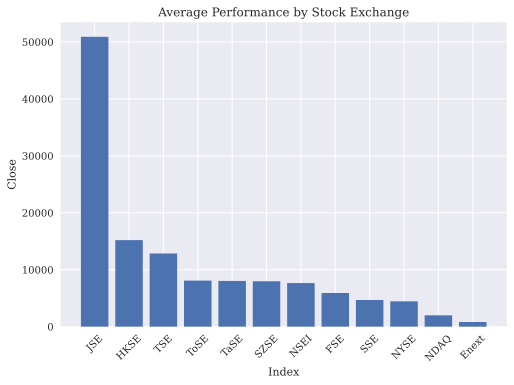

In [ ]:
avg_performance = data.groupby('Index')['Close'].mean()

# Sort the stock exchanges based on average performance in descending order
sorted_performance = avg_performance.sort_values(ascending=False)

# Create a bar chart
plt.bar(sorted_performance.index, sorted_performance)

# Add labels and title to the chart
plt.xlabel('Index')
plt.ylabel('Close')
plt.title('Average Performance by Stock Exchange')

# Rotate x-axis labels if needed
plt.xticks(rotation=45)

# Display the chart
plt.show()

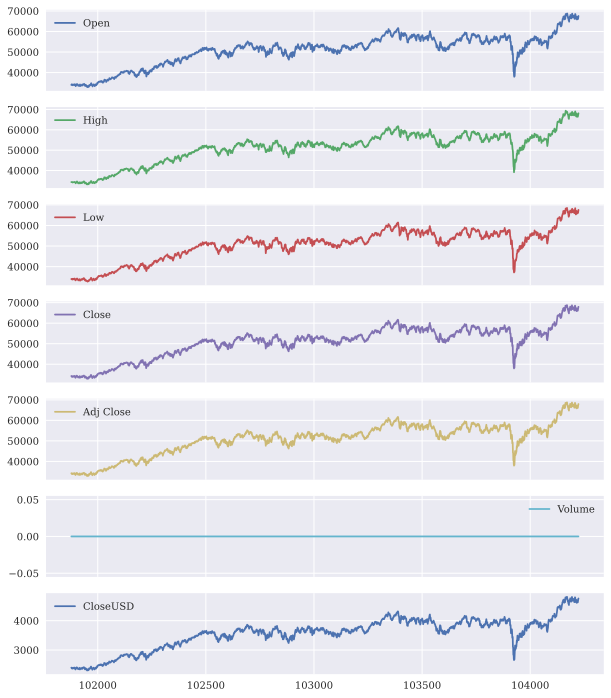

In [ ]:
JSE.plot(figsize=(10, 12), subplots=True);
# plt.savefig('../../images/ch08/fts_01.png');

<ipython-input-17-efc31c43c819>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = data.corr()


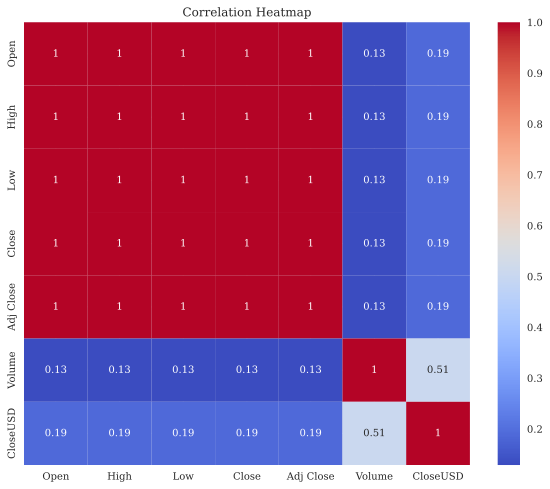

In [ ]:
import seaborn as sns
# Create a correlation matrix using the DataFrame
corr_matrix = data.corr()

# Create a heatmap using the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')

# Add title to the chart
plt.title('Correlation Heatmap')

# Display the chart
plt.show()

In [ ]:
plt.scatter(data['Close'], data['Index'])

# Add labels and title to the chart
plt.xlabel('Close')
plt.ylabel('Index')
plt.title('Scatter Plot')

# Display the chart
plt.show()

In [ ]:
JSE.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2346 entries, 101878 to 104223
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Index      2346 non-null   object 
 1   Date       2346 non-null   object 
 2   Open       2346 non-null   float64
 3   High       2346 non-null   float64
 4   Low        2346 non-null   float64
 5   Close      2346 non-null   float64
 6   Adj Close  2346 non-null   float64
 7   Volume     2346 non-null   float64
 8   CloseUSD   2346 non-null   float64
dtypes: float64(7), object(2)
memory usage: 183.3+ KB


In [ ]:
JSE.head()

,Index,Date,Open,High,Low,Close,Adj Close,Volume,CloseUSD
101878,JSE,2012-02-08,33974.44922,34282.94141,33974.44922,34226.73047,34226.73047,0.0,2395.871133
101879,JSE,2012-02-09,34226.73047,34307.44922,34041.67188,34268.14063,34268.14063,0.0,2398.769844
101880,JSE,2012-02-10,34268.14063,34268.14063,33829.71094,33892.57813,33892.57813,0.0,2372.480469
101881,JSE,2012-02-13,33892.57813,34230.21094,33892.57813,34207.42969,34207.42969,0.0,2394.520078
101882,JSE,2012-02-14,34207.42969,34245.91016,34044.42188,34112.44141,34112.44141,0.0,2387.870899


In [ ]:
JSE.tail()

,Index,Date,Open,High,Low,Close,Adj Close,Volume,CloseUSD
104219,JSE,2021-05-25,66054.92188,66812.45313,66022.97656,66076.67969,66076.67969,0.0,4625.367578
104220,JSE,2021-05-26,66076.67969,66446.36719,66030.35156,66108.22656,66108.22656,0.0,4627.575859
104221,JSE,2021-05-27,66108.22656,66940.25000,66102.54688,66940.25000,66940.25000,0.0,4685.817500
104222,JSE,2021-05-28,66940.25000,67726.56250,66794.60938,67554.85938,67554.85938,0.0,4728.840157
104223,JSE,2021-05-31,67554.85938,68140.85156,67554.85938,67964.03906,67964.03906,0.0,4757.482734


In [ ]:
JSE.mean()

<ipython-input-22-f17f578bd3cc>:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  JSE.mean()


Open         50896.729912
High         51220.236232
Low          50589.752451
Close        50910.945859
Adj Close    50910.945859
Volume           0.000000
CloseUSD      3563.766210
dtype: float64

In [ ]:
JSE.describe().round(2)

,Open,High,Low,Close,Adj Close,Volume,CloseUSD
count,2346.00,2346.00,2346.00,2346.00,2346.00,2346.0,2346.00
mean,50896.73,51220.24,50589.75,50910.95,50910.95,0.0,3563.77
std,7604.52,7656.54,7559.89,7605.11,7605.11,0.0,532.36
min,32887.45,33160.37,32730.92,32887.45,32887.45,0.0,2302.12
25%,47863.32,48206.35,47494.74,47890.57,47890.57,0.0,3352.34
50%,52172.32,52490.71,51811.95,52178.09,52178.09,0.0,3652.47
75%,55936.56,56314.22,55646.15,55942.83,55942.83,0.0,3916.00
max,68775.06,69403.75,68516.99,68775.06,68775.06,0.0,4814.25


In [ ]:
data.aggregate([min,
              np.mean,
              np.std,
              np.median,
              max]
).round(2)

<ipython-input-24-5a42dfd556d9>:1: FutureWarning: ['Index', 'Date'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  data.aggregate([min,


,Index,Date,Open,High,Low,Close,Adj Close,Volume,CloseUSD
min,Enext,1965-01-05,54.87,54.87,54.87,54.87,54.87,0.000000e+00,10.20
mean,NaN,NaN,8015.35,8063.32,7962.58,8014.37,8014.16,1.347646e+09,3046.73
std,NaN,NaN,9140.56,9196.58,9082.77,9140.61,9140.72,4.427662e+09,3747.87
median,NaN,NaN,5772.14,5812.76,5725.20,5773.71,5773.71,9.529000e+05,1371.60
max,ToSE,2021-06-03,68775.06,69403.75,68516.99,68775.06,68775.06,9.440374e+10,18934.38


Trading strategy

In [ ]:
stock_group = data.groupby('Index')['Date'].agg(['min', 'max'])
print(stock_group)

              min         max
Index                        
Enext  1999-12-31  2021-06-02
FSE    1987-12-30  2021-05-31
HKSE   1986-12-31  2021-05-31
JSE    2012-02-08  2021-05-31
NDAQ   1971-02-05  2021-05-28
NSEI   2007-09-17  2021-05-31
NYSE   1965-12-31  2021-05-28
SSE    1990-11-09  2021-05-31
SZSE   1997-08-22  2021-06-02
TSE    1965-01-05  2021-06-03
TaSE   1997-07-02  2021-05-31
ToSE   1979-06-29  2021-05-31


Technical analysis

In [ ]:
sym = 'JSE'

In [ ]:
data = pd.DataFrame(JSE['Close']).dropna()

In [ ]:
SMA1 = 30
SMA2 = 365

In [ ]:
data['SMA1'] = data['Close'].rolling(SMA1).mean()
data['SMA2'] = data['Close'].rolling(SMA2).mean()

<Axes: >

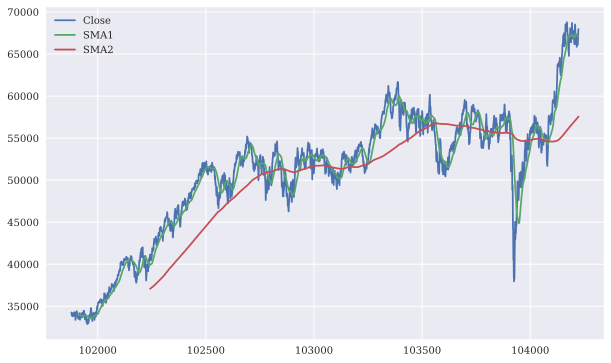

In [ ]:
data.plot(figsize=(10, 6))

In [ ]:
data.dropna(inplace=True)

In [ ]:
data['positions'] = np.where(data['SMA1'] > data['SMA2'],
                             1,
                             -1)

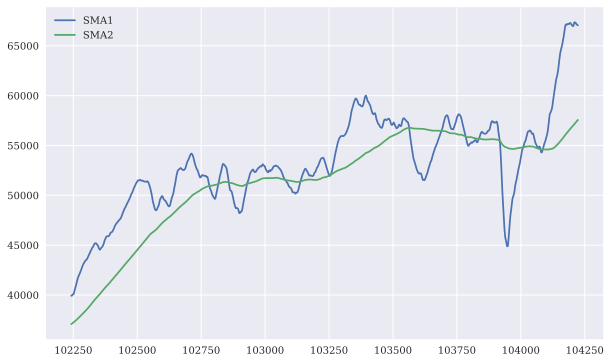

In [ ]:
data[['SMA1', 'SMA2']].plot(figsize=(10, 6));
# plt.savefig('../../images/ch08/fts_06.png');

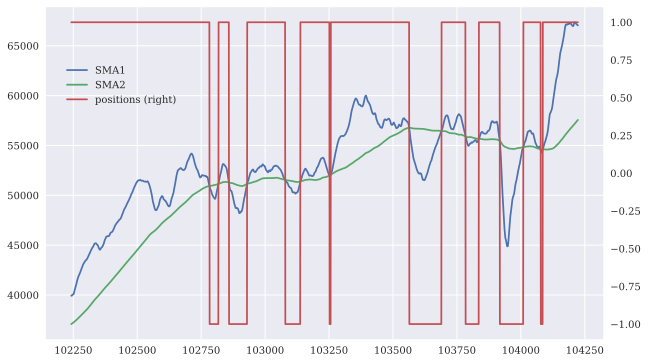

In [ ]:
ax = data[['SMA1', 'SMA2', 'positions']].plot(figsize=(10, 6),
                                              secondary_y='positions')
ax.get_legend().set_bbox_to_anchor((0.25, 0.85));
# plt.savefig('../../images/ch08/fts_07.png');

In [ ]:
raw = pd.read_csv('indexProcessed.csv',
                 index_col=0, parse_dates=True)

In [ ]:
data = data.replace('HSI', 'HKSE')
data = data.replace('IXIC', 'NDAQ')
data = data.replace('000001.SS', 'SSE')
data = data.replace('N225', 'TSE')
data = data.replace('N100', 'Enext')
data = data.replace('399001.SZ', 'SZSE')
data = data.replace('GSPTSE', 'ToSE')
data = data.replace('NSEI', 'NSEI')
data = data.replace('GDAXI', 'FSE')
data = data.replace('KS11', 'KEx')
data = data.replace('SSMI', 'SSE')
data = data.replace('TWII', 'TaSE')
data = data.replace('J203.JO', 'JSE')
data = data.replace('NYA', 'NYSE')

In [ ]:
data.tail()

,Close,SMA1,SMA2,positions
104219,66076.67969,67141.964585,57429.685799,1
104220,66108.22656,67109.822397,57459.277355,1
104221,66940.25000,67080.759116,57491.252837,1
104222,67554.85938,67071.817970,57524.504699,1
104223,67964.03906,67047.326564,57557.922754,1


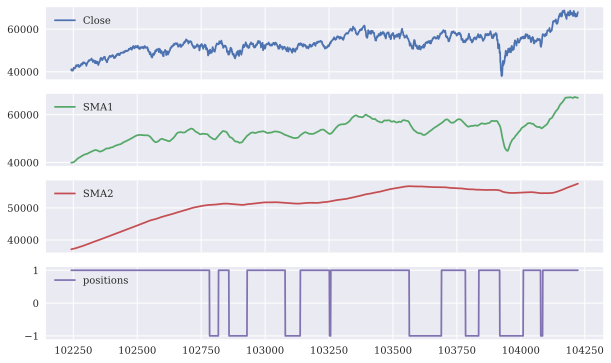

In [ ]:
data.plot(subplots=True, figsize=(10, 6));
# plt.savefig('../../images/ch08/fts_08.png');

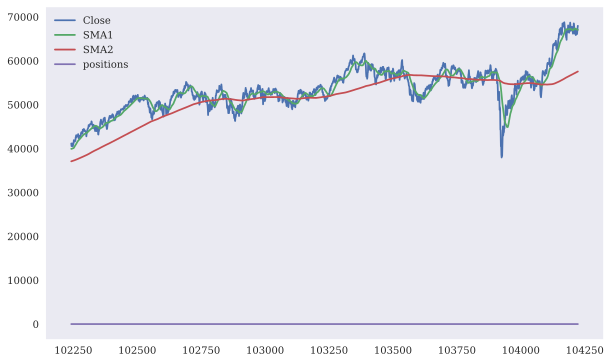

In [ ]:
data.loc[:'2012-12-31'].plot(secondary_y='JSE', figsize=(10, 6));
# plt.savefig('../../images/ch08/fts_09.png');

Log return

In [ ]:
rets = np.log(data / data.shift(1))

/usr/local/lib/python3.10/dist-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: invalid value encountered in log
  result = func(self.values, **kwargs)


In [ ]:
rets.head()

,Close,SMA1,SMA2,positions
102242,NaN,NaN,NaN,NaN
102243,-0.014645,-0.000220,0.000467,0.0
102244,0.008464,-0.000033,0.000489,0.0
102245,0.006885,0.001298,0.000537,0.0
102246,-0.007067,0.000933,0.000493,0.0


In [ ]:
rets.dropna(inplace=True)

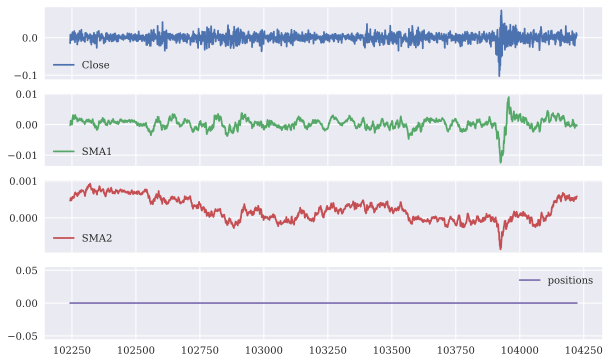

In [ ]:
rets.plot(subplots=True, figsize=(10, 6));
# plt.savefig('../../images/ch08/fts_10.png');

In [ ]:
pd.plotting.scatter_matrix(rets,
                           alpha=0.2,
                           diagonal='hist',
                           hist_kwds={'bins': 35},
                           figsize=(10, 6));
# plt.savefig('../../images/ch08/fts_11.png');

/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/misc.py:101: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(boundaries_list[j])
/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/misc.py:102: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(boundaries_list[i])
/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/misc.py:92: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(boundaries_list[i])


OLS Regression

In [ ]:
reg = np.polyfit(rets['SMA1'], rets['SMA2'], deg=1)

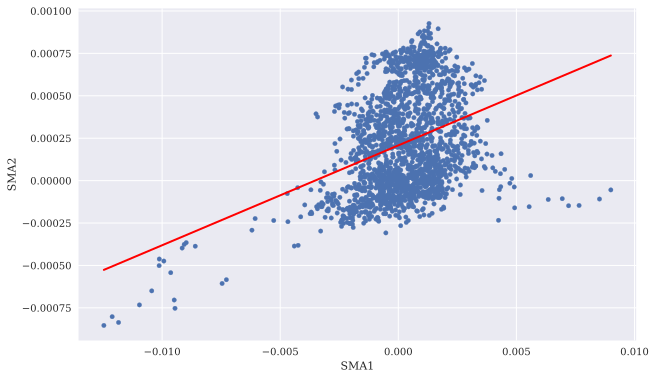

In [ ]:
ax = rets.plot(kind='scatter', x='SMA1', y='SMA2', figsize=(10, 6))
ax.plot(rets['SMA1'], np.polyval(reg, rets['SMA1']), 'r', lw=2);
# plt.savefig('../../images/ch08/fts_12.png');

It show the regression for the long term period and short term period for JSE

In [ ]:
rets.corr()

,Close,SMA1,SMA2,positions
Close,1.000000,0.150576,0.071298,NaN
SMA1,0.150576,1.000000,0.349329,NaN
SMA2,0.071298,0.349329,1.000000,NaN
positions,NaN,NaN,NaN,NaN


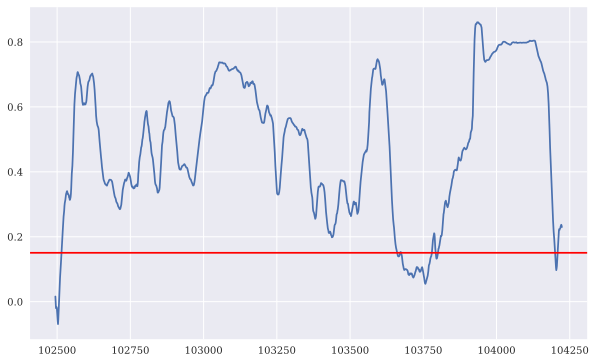

In [ ]:
ax = rets['SMA1'].rolling(window=252).corr(
                  rets['SMA2']).plot(figsize=(10, 6))
ax.axhline(rets.corr().iloc[0, 1], c='r');
# plt.savefig('../../images/ch08/fts_13.png');

JSE is the highest recommendation stock for the investor to invest because their performance and potential to growth.